In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Pix2Pix: Satellite to Map Translation

PyTorch implementation of **Pix2Pix GAN** for translating satellite imagery to map representations.

## What This Does

Trains a conditional GAN to transform:
- **Input:** Satellite imagery (RGB photos from above)
- **Output:** Stylized map representations (roads, water, buildings)

Based on the paper: [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/abs/1611.07004) (Isola et al., 2017)

## Quick Start

### Google Colab (Required - GPU Training)
1. Click "Open in Colab" badge above
2. **Runtime → Change runtime type → GPU (T4)**
3. **Runtime → Run all**
4. **Training time: ~1.25 hours for 90 epochs**

**Note:** This notebook requires a GPU to run efficiently. Local CPU training is not recommended.

## Expected Results

After 90 epochs on GPU:
- **L1 Error:** ~0.05-0.07 (5-7% pixel difference)
- **Output Quality:** High-quality maps with accurate structure, colors, and fine details
- **Training Time:** ~1.25 hours (75 minutes)

Note: This 90-epoch training provides excellent results. Best results require 100-200 epochs as recommended in the original paper.

## Architecture Overview

**Generator:** U-Net (54M parameters)
- 8 encoder layers → bottleneck → 7 decoder layers
- Skip connections preserve spatial details

**Discriminator:** PatchGAN (2.8M parameters)  
- Classifies 70×70 patches instead of full image
- Encourages realistic local textures

**Loss:** Adversarial + L1  
`loss_G = GAN_loss + 100 × L1_loss`

**Author:** Linh Nguyen   
**Dataset:** [Berkeley Maps Dataset](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/)

In [2]:
# Imports

# Standard library
import sys
import os
import time
import glob
import random
import urllib.request
import tarfile
from pathlib import Path

# Scientific computing
import numpy as np
import matplotlib.pyplot as plt

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image

# Image processing
from PIL import Image

In [3]:
# Check GPU availability (REQUIRED)
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

if not torch.cuda.is_available():
    raise RuntimeError(
        "GPU NOT DETECTED!\n\n"
        "This notebook requires a GPU to run.\n"
        "Please enable GPU in Colab:\n"
        "Runtime → Change runtime type → GPU (T4)\n"
        "Then restart the runtime."
    )

gpu_name = torch.cuda.get_device_name(0)
gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9
print(f"GPU detected: {gpu_name}")
print(f"GPU memory: {gpu_memory:.2f} GB")
device = torch.device('cuda')
print(f"\nUsing device: {device}")

PyTorch version: 2.9.0+cu126
CUDA available: True
GPU detected: Tesla T4
GPU memory: 15.83 GB

Using device: cuda


In [4]:
# Set seeds
torch.manual_seed(99)
np.random.seed(99)
random.seed(99)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(99)

Dataset Setup and Exploration

### 1. Load the dataset


In [5]:
# Set Colab path
DATA_ROOT = Path('/content/data')
PATH = DATA_ROOT / 'maps'

print(f"Expected path: {PATH}")

# Download if needed or if structure is incomplete
train_path = PATH / 'train'
val_path = PATH / 'val'

if not PATH.exists() or not train_path.exists() or not val_path.exists():
    print("\nDataset not found or incomplete. Downloading...")

    # Create directory
    os.makedirs(DATA_ROOT, exist_ok=True)

    # Download
    dataset_url = 'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz'
    tar_path = DATA_ROOT / 'maps.tar.gz'

    print(f"Downloading from: {dataset_url}")
    !wget --show-progress {dataset_url} -O {tar_path}

    # Extract (tarball contains 'maps' directory)
    print("\nExtracting...")
    !tar -xzf {tar_path} -C {DATA_ROOT}

    # Cleanup
    print("Cleaning up...")
    !rm {tar_path}
else:
    print("✓ Dataset already exists and verified")

# Final verification
print(f"\nVerifying structure:")
print(f"  Train: {train_path}")
print(f"  Val:   {val_path}")

if not train_path.exists() or not val_path.exists():
    print(f"\nERROR: Dataset structure incorrect!")
    print(f"\nAvailable directories in {PATH}:")
    if PATH.exists():
        for item in PATH.iterdir():
            print(f"  - {item}")
    raise FileNotFoundError("Dataset directories missing. Try deleting /content/data and re-running.")

# Count images
train_count = len(list(train_path.glob('*.jpg')))
val_count = len(list(val_path.glob('*.jpg')))

print(f"\n✓ Dataset verified:")
print(f"   Training:   {train_count:,} images")
print(f"   Validation: {val_count:,} images")
print(f"   Total:      {train_count + val_count:,} images")

# Warn if incomplete
if train_count < 1000 or val_count < 1000:
    print(f"\nWARNING: Expected ~1,096 training and ~1,098 validation images")
    print("   Dataset may be incomplete. Consider re-downloading.")

# Create image lists for later use
train_images = sorted(list(train_path.glob('*.jpg')))
val_images = sorted(list(val_path.glob('*.jpg')))

print(f"\n✓ Image lists created:")
print(f"   train_images: {len(train_images):,} paths")
print(f"   val_images:   {len(val_images):,} paths")

Expected path: /content/data/maps

Dataset not found or incomplete. Downloading...
--2025-12-28 04:21:12--  http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 250242400 (239M) [application/x-gzip]
Saving to: ‘/content/data/maps.tar.gz’

/content/data/maps. 100%[===================>] 238.65M   253KB/s    in 8m 2s   

2025-12-28 04:29:14 (507 KB/s) - ‘/content/data/maps.tar.gz’ saved [250242400/250242400]


Extracting...
Cleaning up...

Verifying structure:
  Train: /content/data/maps/train
  Val:   /content/data/maps/val

✓ Dataset verified:
   Training:   1,096 images
   Validation: 1,098 images
   Total:      2,194 images

✓ Image lists created:
   train_images: 1,096 paths
   val_images:   1,098 paths



Image name: 1.jpg


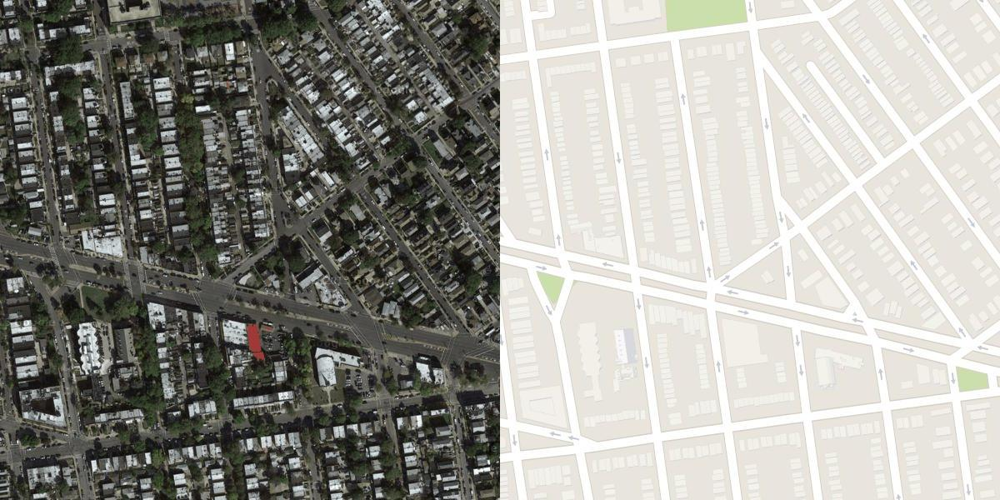

In [6]:
# Load the first training image
first_image_path = train_images[0]
print(f"\nImage name: {first_image_path.name}")

first_image = Image.open(first_image_path)
first_image  # Display in notebook

In [7]:
# Image properties:
print(f" Size (width x height): {first_image.size}")
print(f" Mode: {first_image.mode}")
print(f" Format: {first_image.format}")

 Size (width x height): (1200, 600)
 Mode: RGB
 Format: JPEG


In [8]:
# Convert to tensor
to_tensor = transforms.ToTensor()
img_tensor = to_tensor(first_image)
print(f"  Shape: {img_tensor.shape}")

  Shape: torch.Size([3, 600, 1200])


In [9]:
# Understand Image Structure
width, height = first_image.size
print(f"  width:  {width} pixels")
print(f"  height: {height} pixels")

# The images are side-by-side pairs
half_width = width // 2
print(f"\nSide-by-side structure:")
print(f"  Left half (input):   0 to {half_width} pixels (satellite view)")
print(f"  Right half (target): {half_width} to {width} pixels (map view)")

# Split the image
input_image = first_image.crop((0, 0, half_width, height))
target_image = first_image.crop((half_width, 0, width, height))

print(f"\nAfter splitting:")
print(f"  Input image:  {input_image.size}")
print(f"  Target image: {target_image.size}")

  width:  1200 pixels
  height: 600 pixels

Side-by-side structure:
  Left half (input):   0 to 600 pixels (satellite view)
  Right half (target): 600 to 1200 pixels (map view)

After splitting:
  Input image:  (600, 600)
  Target image: (600, 600)



Saved: explore_one_pair.png


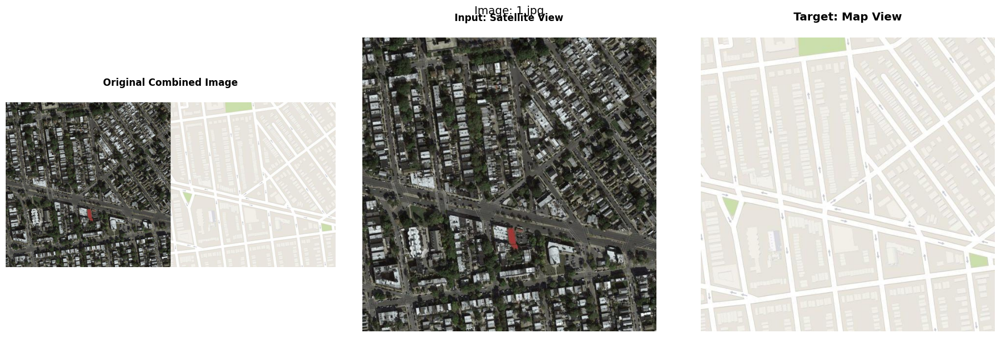

In [10]:
# Visualize One Image Pair
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original combined image
axes[0].imshow(first_image)
axes[0].set_title('Original Combined Image\n', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Input (satellite) - LEFT HALF
axes[1].imshow(input_image)
axes[1].set_title('Input: Satellite View\n', fontsize=12, fontweight='bold')
axes[1].axis('off')

# Target (map) - RIGHT HALF
axes[2].imshow(target_image)
axes[2].set_title('Target: Map View\n', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.suptitle(f'Image: {first_image_path.name}', fontsize=14, y=0.98)
plt.tight_layout()
plt.savefig('explore_one_pair.png', dpi=150, bbox_inches='tight')
print("\nSaved: explore_one_pair.png")
plt.show()

### 2. Data transforms function

In [11]:
# Create image preprocessing pipeline for training or testing.
# Training transforms include data augmentation (random crop, flip) to prevent overfitting and improve generalization.
# Testing transforms only resize - no randomness for consistent evaluation.
def get_transforms(is_train=True):
    if is_train:  # Training pipeline with augmentation
        transform_list = [
            transforms.Resize((286, 286), transforms.InterpolationMode.BICUBIC),  # Resize to 286x286 (slightly larger than target), BICUBIC = high-quality interpolation for smooth resizing
            transforms.RandomCrop(256), # Random crop to 256x256 - adds positional variation
            transforms.RandomHorizontalFlip(p=0.5),  # Random horizontal flip with 50% probability
            transforms.ToTensor(), # Convert PIL Image to PyTorch tensor [0, 1].  Changes shape from (H, W, C) to (C, H, W)
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))] # Normalize to [-1, 1] range (required for Tanh output). Formula: (x - 0.5) / 0.5 = 2x - 1. Separate normalization for each RGB channel
    else:
        # Testing pipeline - NO randomness for reproducible evaluation
        transform_list = [transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC), # Resize directly to 256x256 (no crop)
            transforms.ToTensor(), # Convert to tensor [0, 1]
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]   # Normalize to [-1, 1] (same as training)
    return transforms.Compose(transform_list)   # Compose = chain transforms together (apply sequentially)

### 3. Pix2PixDataset class

In [12]:
# PyTorch Dataset for loading Pix2Pix paired images.
# Each image file contains two images side-by-side: Left half: Input (e.g., satellite view), Right half: Target (e.g., map view)
# This class splits them and applies synchronized transforms.
class Pix2PixDataset(Dataset):
    def __init__(self, root_dir, split='train', direction='AB', transform=None):
        """
        Initialize dataset.
        Args:
            root_dir (str/Path): Root directory containing train/ and val/
            split (str): 'train' or 'val' - which subset to load
            direction (str): 'AB' = Satellite→Map, 'BA' = Map→Satellite
            transform: torchvision transforms to apply
        """
        self.root_dir = Path(root_dir)  # Convert to Path object
        self.split = split  # Store split name
        self.direction = direction  # Store translation direction
        self.transform = transform  # Store transform pipeline

        # Get all image paths from the split directory
        image_dir = self.root_dir / split
        self.image_paths = sorted(glob.glob(str(image_dir / '*.jpg')))  # Find all JPGs

        # Verify we found images
        if len(self.image_paths) == 0:
            raise ValueError(f"No images found in {image_dir}")
        print(f"  Loaded {len(self.image_paths):,} images from {split} set")

    def __len__(self):
        """Return total number of samples in dataset."""
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Load and process a single training sample.
        Args: idx (int): Index of sample to load
        Returns: tuple: (input_image, target_image) as tensors
        """
        # Load the combined image (contains both input and target)
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')  # Ensure RGB (not grayscale)

        # Split image into left and right halves
        w, h = image.size  # Get width and height
        w_half = w // 2  # Calculate halfway point (// = integer division)

        if self.direction == 'AB':
            # Standard: Satellite (left) → Map (right)
            input_img = image.crop((0, 0, w_half, h))  # Left half
            target_img = image.crop((w_half, 0, w, h))  # Right half
        else:
            # Reverse: Map (right) → Satellite (left)
            input_img = image.crop((w_half, 0, w, h))  # Right half
            target_img = image.crop((0, 0, w_half, h))  # Left half

        # Apply transforms with synchronized randomness
        if self.transform:
            # Use same random seed for both images. This ensures RandomCrop and RandomFlip are identical. Otherwise input and target wouldn't match after augmentation!
            seed = np.random.randint(99)  # Generate random seed

            # Apply transform to input with this seed
            torch.manual_seed(seed)
            random.seed(seed)
            input_img = self.transform(input_img)

            # Apply same transform to target with SAME seed
            torch.manual_seed(seed)
            random.seed(seed)
            target_img = self.transform(target_img)

        return input_img, target_img  # Return as tuple


### 4. Training configuration

In [13]:
# Training hyperparameters
CONFIG = {
    'batch_size': 8,           # Batch size for GPU
    'num_workers': 2,          # Parallel data loading
    'num_epochs': 90,          # Number of training epochs
    'save_interval': 10,        # Save samples every N epochs
    'checkpoint_interval': 15,  # Save checkpoint every N epochs
    'lr': 0.0002,             # Learning rate
    'beta1': 0.5,             # Adam optimizer beta1
    'beta2': 0.999,           # Adam optimizer beta2
    'lambda_L1': 100,         # Weight for L1 loss
    'ngf': 64,                # Generator filters
    'ndf': 64,                # Discriminator filters
}
print("TRAINING CONFIGURATION")
for key, value in CONFIG.items():
    print(f"  {key:20s}: {value}")

# Calculate training info
train_size = 1096  # Number of training images
steps_per_epoch = train_size // CONFIG['batch_size']
total_steps = steps_per_epoch * CONFIG['num_epochs']

print(f"\nTraining Info:")
print(f"  Steps per epoch:  {steps_per_epoch}")
print(f"  Total steps:      {total_steps:,}")
print(f"  Samples saved at: epochs {list(range(CONFIG['save_interval'], CONFIG['num_epochs']+1, CONFIG['save_interval']))}")
print(f"  Checkpoints at:   epochs {list(range(CONFIG['checkpoint_interval'], CONFIG['num_epochs']+1, CONFIG['checkpoint_interval']))}")


TRAINING CONFIGURATION
  batch_size          : 8
  num_workers         : 2
  num_epochs          : 90
  save_interval       : 10
  checkpoint_interval : 15
  lr                  : 0.0002
  beta1               : 0.5
  beta2               : 0.999
  lambda_L1           : 100
  ngf                 : 64
  ndf                 : 64

Training Info:
  Steps per epoch:  137
  Total steps:      12,330
  Samples saved at: epochs [10, 20, 30, 40, 50, 60, 70, 80, 90]
  Checkpoints at:   epochs [15, 30, 45, 60, 75, 90]


### 5.  Create Dataloader

In [14]:
# Create dataset instances with appropriate transforms
train_dataset = Pix2PixDataset(PATH, split='train', transform=get_transforms(is_train=True))  # Apply augmentation
val_dataset = Pix2PixDataset(PATH, split='val', transform=get_transforms(is_train=False)) # NO augmentation for evaluation

  Loaded 1,096 images from train set
  Loaded 1,098 images from val set


In [15]:
# Create DataLoaders for GPU training
train_loader = DataLoader(
    train_dataset,
    batch_size=CONFIG['batch_size'],
    shuffle=True,
    num_workers=CONFIG['num_workers'],
    pin_memory=True  # Speed up GPU transfer
)

val_loader = DataLoader(
    val_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=CONFIG['num_workers'],
    pin_memory=True  # Speed up GPU transfer
)


### 6. Generator (U-Net Architecture)

In [16]:
# Downsampling block for U-Net encoder.
    # Each block: Conv2d → BatchNorm → LeakyReLU → (optional) Dropout
    # Reduces spatial dimensions by 2x (stride=2)
class UNetDown(nn.Module):
    def __init__(self, in_channels, out_channels, normalize=True, dropout=0.0):
        """
        Args:
            in_channels (int): Input channels
            out_channels (int): Output channels
            normalize (bool): Apply batch normalization?
            dropout (float): Dropout probability (0 = no dropout)
        """
        super(UNetDown, self).__init__()

        # Build layer sequence
            # Convolutional layer: downsample 2x with 4x4 kernel
            # stride=2 means output is half the size
            # padding=1 maintains reasonable spatial dimensions
            # bias=False because BatchNorm makes it redundant
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False)]

        # Batch Normalization: normalize activations across batch. Helps training stability and allows higher learning rates
        if normalize:
            layers.append(nn.BatchNorm2d(out_channels))

        # LeakyReLU: allows small negative gradients (0.2 = leak coefficient). Better than ReLU for GANs - prevents "dying neurons"
        layers.append(nn.LeakyReLU(0.2, inplace=True))

        # Dropout: randomly zero out activations during training. Prevents overfitting by forcing redundant representations
        if dropout > 0:
            layers.append(nn.Dropout(dropout))

        # Combine all layers into sequential container
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        """Forward pass."""
        return self.model(x)

In [17]:
# Upsampling block for U-Net decoder.
    # Each block: ConvTranspose2d → BatchNorm → ReLU → (optional) Dropout
    # Increases spatial dimensions by 2x (stride=2)
    # Includes skip connection from encoder
class UNetUp(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        """
        Args:
            in_channels (int): Input channels (will be doubled after skip concat)
            out_channels (int): Output channels
            dropout (float): Dropout probability
        """
        super(UNetUp, self).__init__()

        # Transposed convolution (deconvolution): upsample 2x
            # "Inverse" of Conv2d - increases spatial dimensions
            # stride=2 means output is 2x the size
        layers = [nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_channels), # Batch normalization
            nn.ReLU(inplace=True)] # ReLU: standard activation (not leaky) for decoder. # inplace=True saves memory by modifying input directly

        if dropout > 0:
            layers.append(nn.Dropout(dropout))

        self.model = nn.Sequential(*layers)

    def forward(self, x, skip_input):
        """
        Forward pass with skip connection.
        Args:
            x: Upsampled features from previous layer
            skip_input: Features from encoder at same resolution (skip connection)
        Returns:
            Concatenated features (channels are doubled)
        """
        # Upsample the input
        x = self.model(x)

        # Concatenate with skip connection along channel dimension (dim=1)
        # This allows decoder to use both: High-level semantic info (from x) and Low-level detail (from skip_input)
        x = torch.cat((x, skip_input), dim=1)

        return x

In [18]:
# U-Net Generator for Pix2Pix.
# Architecture: Encoder-Decoder with skip connections
    # Encoder: Progressively downsample and extract features
    # Decoder: Progressively upsample and reconstruct image
    # Skip connections: Preserve spatial details lost in downsampling
    # Input: 256x256x3 RGB image
    # Output: 256x256x3 RGB image

class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, ngf=64):
        """
        Args:
            in_channels (int): Input image channels (3 for RGB)
            out_channels (int): Output image channels (3 for RGB)
            ngf (int): Number of generator filters in first layer
        """
        super(GeneratorUNet, self).__init__()

        # ENCODER (Downsampling path): Each layer halves spatial dimensions, doubles channels
        # Layer 1: 256x256 → 128x128, channels: 3 → ngf
        # No normalization on first layer
        self.down1 = UNetDown(in_channels, ngf, normalize=False)

        # Layer 2: 128x128 → 64x64, channels: ngf → ngf*2
        self.down2 = UNetDown(ngf, ngf * 2)

        # Layer 3: 64x64 → 32x32, channels: ngf*2 → ngf*4
        self.down3 = UNetDown(ngf * 2, ngf * 4)

        # Layer 4: 32x32 → 16x16, channels: ngf*4 → ngf*8
        self.down4 = UNetDown(ngf * 4, ngf * 8)

        # Layer 5: 16x16 → 8x8, channels: ngf*8 → ngf*8
        self.down5 = UNetDown(ngf * 8, ngf * 8)

        # Layer 6: 8x8 → 4x4, channels: ngf*8 → ngf*8
        self.down6 = UNetDown(ngf * 8, ngf * 8)

        # Layer 7: 4x4 → 2x2, channels: ngf*8 → ngf*8
        self.down7 = UNetDown(ngf * 8, ngf * 8)

        # Bottleneck: 2x2 → 1x1, channels: ngf*8 → ngf*8
        # Deepest layer - most compressed representation
        self.down8 = UNetDown(ngf * 8, ngf * 8, normalize=False)

        # DECODER (Upsampling path)
        # Each layer doubles spatial dimensions
        # Skip connections double input channels

        # Layer 1: 1x1 → 2x2, skip from down7
        # Input: ngf*8, After skip: ngf*8*2, Output: ngf*8
        # Dropout=0.5 for first 3 layers
        self.up1 = UNetUp(ngf * 8, ngf * 8, dropout=0.5)

        # Layer 2: 2x2 → 4x4, skip from down6
        # Input: ngf*8*2 (after skip), Output: ngf*8
        self.up2 = UNetUp(ngf * 8 * 2, ngf * 8, dropout=0.5)

        # Layer 3: 4x4 → 8x8, skip from down5
        self.up3 = UNetUp(ngf * 8 * 2, ngf * 8, dropout=0.5)

        # Layer 4: 8x8 → 16x16, skip from down4
        # No more dropout from here
        self.up4 = UNetUp(ngf * 8 * 2, ngf * 8)

        # Layer 5: 16x16 → 32x32, skip from down3
        self.up5 = UNetUp(ngf * 8 * 2, ngf * 4)

        # Layer 6: 32x32 → 64x64, skip from down2
        self.up6 = UNetUp(ngf * 4 * 2, ngf * 2)

        # Layer 7: 64x64 → 128x128, skip from down1
        self.up7 = UNetUp(ngf * 2 * 2, ngf)

        # FINAL LAYER
        # Final upsampling: 128x128 → 256x256
        # Input: ngf*2 (after skip from down1), Output: out_channels (3)
        self.final = nn.Sequential(
            # Transposed conv to reach final resolution
            nn.ConvTranspose2d(ngf * 2, out_channels, kernel_size=4, stride=2, padding=1),

            # Tanh activation: outputs in range [-1, 1]
            # Matches our normalized input range
            nn.Tanh()
        )

    def forward(self, x):
        """
        Forward pass through U-Net.
        Args:
            x: Input image tensor [batch, 3, 256, 256]
        Returns:
            Generated image tensor [batch, 3, 256, 256]
        """
        # Encoder: progressively downsample, save skip connections
        d1 = self.down1(x)      # 128x128
        d2 = self.down2(d1)     # 64x64
        d3 = self.down3(d2)     # 32x32
        d4 = self.down4(d3)     # 16x16
        d5 = self.down5(d4)     # 8x8
        d6 = self.down6(d5)     # 4x4
        d7 = self.down7(d6)     # 2x2
        d8 = self.down8(d7)     # 1x1 (bottleneck)

        # Decoder: progressively upsample, concatenate skip connections
        u1 = self.up1(d8, d7)   # 2x2 + skip from d7
        u2 = self.up2(u1, d6)   # 4x4 + skip from d6
        u3 = self.up3(u2, d5)   # 8x8 + skip from d5
        u4 = self.up4(u3, d4)   # 16x16 + skip from d4
        u5 = self.up5(u4, d3)   # 32x32 + skip from d3
        u6 = self.up6(u5, d2)   # 64x64 + skip from d2
        u7 = self.up7(u6, d1)   # 128x128 + skip from d1

        # Final layer: upsample to 256x256 and apply Tanh
        return self.final(u7)

### 7. Discriminator(PatchGAN)

In [19]:
# PatchGAN Discriminator for Pix2Pix.
# Instead of classifying entire image as real/fake, classifies overlapping 70x70 patches. This encourages high-frequency detail.
# Input: Concatenated [input_image, target_image] = 6 channels
# Output: NxN array of real/fake predictions (one per patch)

class Discriminator(nn.Module):
    def __init__(self, in_channels=6, ndf=64):
        """
        Args:
            in_channels (int): Input channels (6 = input(3) + target(3))
            ndf (int): Number of discriminator filters in first layer
        """
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalize=True):
            """
            Create a discriminator layer: Conv → (BatchNorm) → LeakyReLU
            Args:
                in_filters (int): Input channels
                out_filters (int): Output channels
                normalize (bool): Apply batch normalization?
            Returns:
                list: Layer sequence
            """
            layers = [ nn.Conv2d(in_filters, out_filters, kernel_size=4, stride=2, padding=1)]
                # 4x4 convolution with stride=2 (downsample by 2x). padding=1 maintains spatial coherence

            if normalize:
                # BatchNorm
                layers.append(nn.BatchNorm2d(out_filters))

            layers.append(nn.LeakyReLU(0.2, inplace=True))  # LeakyReLU with negative slope 0.2. Allows small gradients for negative values
            return layers

        # Build discriminator architecture
        self.model = nn.Sequential(
            # Layer 1: 256x256x6 → 128x128x64 (NO normalization)
            *discriminator_block(in_channels, ndf, normalize=False),

            # Layer 2: 128x128x64 → 64x64x128
            *discriminator_block(ndf, ndf * 2),

            # Layer 3: 64x64x128 → 32x32x256
            *discriminator_block(ndf * 2, ndf * 4),

            # Layer 4: 32x32x256 → 31x31x512
            # Zero padding to adjust dimensions
            nn.ZeroPad2d((1, 0, 1, 0)),  # Pad right and bottom by 1
            nn.Conv2d(ndf * 4, ndf * 8, kernel_size=4, padding=1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),

            # Final layer: 31x31x512 → 30x30x1
            # Output is 30x30 array of real/fake predictions
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(ndf * 8, 1, kernel_size=4, padding=1)
            # No sigmoid! We use BCEWithLogitsLoss (combines sigmoid + BCE)
        )

    def forward(self, input_img, target_img):
        """
        Forward pass through discriminator.
        Args:
            input_img: Condition image [batch, 3, 256, 256]
            target_img: Real or generated image [batch, 3, 256, 256]
        Returns:
            Patch predictions [batch, 1, 30, 30]
        """
        # Concatenate input and target along channel dimension
        # Creates 6-channel input for conditional discrimination
        img_input = torch.cat((input_img, target_img), dim=1)

        # Pass through network
        return self.model(img_input)

### 8. Loss functions

In [20]:
# GAN loss function wrapper.
# Supports different GAN loss formulations:
    # 'vanilla': Original GAN with binary cross-entropy
    # 'lsgan': Least Squares GAN (more stable, less mode collapse)

class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla'):

        super(GANLoss, self).__init__()
        self.gan_mode = gan_mode

        if gan_mode == 'vanilla': # Binary Cross-Entropy with Logits (numerically stable)
            self.loss = nn.BCEWithLogitsLoss() # Combines sigmoid activation with BCE loss
        elif gan_mode == 'lsgan': # Mean Squared Error (Least Squares GAN)
            self.loss = nn.MSELoss() # Penalizes predictions far from 0 or 1
        else:
            raise ValueError(f"Unknown GAN mode: {gan_mode}")

    def __call__(self, prediction, target_is_real):
        """
        Calculate GAN loss.
        Args:
            prediction: Discriminator output [batch, 1, 30, 30]
            target_is_real (bool): True for real images, False for fake
        Returns:
            Scalar loss value
        """
        if target_is_real: # Target = 1 (real)
            target = torch.ones_like(prediction)
        else:  # Target = 0 (fake)
            target = torch.zeros_like(prediction)
        return self.loss(prediction, target)         # Calculate loss

### 9. Helper functions

In [21]:
# Helper functions


def save_sample_images(generator, val_loader, epoch, output_dir):
    """
    Generate and save sample images for visual inspection.
    Creates a grid showing:
    - Top row: Input images (satellite)
    - Middle row: Ground truth targets (map)
    - Bottom row: Generated outputs
    Args:
        generator: Generator model
        val_loader: Validation data loader
        epoch: Current epoch number (for filename)
        output_dir: Directory to save images
    """
    # Set generator to evaluation mode. This disables dropout and switches batch norm to use running stats
    generator.eval()

    # Disable gradient calculation (faster, uses less memory)
    with torch.no_grad():
        # Get one batch from validation set
        input_imgs, target_imgs = next(iter(val_loader))
        input_imgs = input_imgs.to(device)
        target_imgs = target_imgs.to(device)

        # Generate fake images
        fake_imgs = generator(input_imgs)

        # Denormalize from [-1, 1] to [0, 1] for visualization
        # Formula: (x + 1) / 2 = x * 0.5 + 0.5
        input_imgs = input_imgs * 0.5 + 0.5
        target_imgs = target_imgs * 0.5 + 0.5
        fake_imgs = fake_imgs * 0.5 + 0.5

        # Create comparison image (3 rows: input, target, generated)
        # Take first 4 images from batch
        comparison = torch.cat([
            input_imgs[:4],   # Row 1: inputs
            target_imgs[:4],  # Row 2: targets
            fake_imgs[:4]     # Row 3: generated
        ], dim=0)

        # Save as grid (4 columns)
        save_path = output_dir / f'epoch_{epoch:04d}.png'
        save_image(comparison, save_path, nrow=4, normalize=False)

    # Return to training mode
    generator.train()


def weights_init(m):
    """
    Initialize network weights from normal distribution.
    Following DCGAN paper recommendations:
    - Conv/ConvTranspose: mean=0, std=0.02
    - BatchNorm: mean=1, std=0.02
    Args:
        m: Module to initialize
    """
    classname = m.__class__.__name__

    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, mean=0.0, std=0.02) # Initialize convolutional layers
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, mean=1.0, std=0.02) # Initialize batch normalization layers
        nn.init.constant_(m.bias.data, 0)

### 10. Train functions

In [22]:
def train_pix2pix(generator, discriminator, train_loader, val_loader, config):
    """
    Main training loop for Pix2Pix GAN.
    Alternates between:
    1. Training discriminator (real vs fake classification)
    2. Training generator (fool discriminator + match target)
    Args:
        generator: Generator model
        discriminator: Discriminator model
        train_loader: Training data loader
        val_loader: Validation data loader
        config: Configuration dictionary
    """

    # Setup optimizers
    # Adam optimizer for generator
    optimizer_G = optim.Adam(generator.parameters(), lr=config['lr'], betas=(config['beta1'], config['beta2']))  # betas = (momentum, RMSprop) coefficients
    # Adam optimizer for discriminator
    optimizer_D = optim.Adam(discriminator.parameters(), lr=config['lr'],betas=(config['beta1'], config['beta2']))


    # Setup loss functions
    # GAN loss: adversarial training
    criterion_GAN = GANLoss(gan_mode='vanilla')
    # L1 loss: pixel-wise reconstruction. Encourages generator to produce outputs close to targets
    criterion_L1 = nn.L1Loss()
    # Weight for L1 loss
    lambda_L1 = config['lambda_L1']

    # Setup output directories
    output_dir = Path('pix2pix_results')
    output_dir.mkdir(exist_ok=True)  # Create if doesn't exist
    samples_dir = output_dir / 'samples'
    samples_dir.mkdir(exist_ok=True)
    checkpoints_dir = output_dir / 'checkpoints'
    checkpoints_dir.mkdir(exist_ok=True)

    # Initialize training state

    # Set models to training mode
    generator.train()
    discriminator.train()

    # Tracking variables
    start_time = time.time()
    global_step = 0  # Total batches processed

    # History for plotting
    history = {'D_loss': [],'G_loss': [],'G_GAN': [],'G_L1': []}

    print("STARTING TRAINING")
    print(f"Total epochs: {config['num_epochs']}")
    print(f"Batches per epoch: {len(train_loader)}")
    print(f"Total steps: {config['num_epochs'] * len(train_loader)}")
    print(f"Save samples every: {config['save_interval']} epochs")
    print(f"Save checkpoints every: {config['checkpoint_interval']} epochs")

    # Save initial (untrained) samples
    save_sample_images(generator, val_loader, 0, samples_dir)
    print(" Saved initial (untrained) samples\n")

    # Main training loop
    for epoch in range(1, config['num_epochs'] + 1):
        epoch_start_time = time.time()

        # Losses for this epoch
        epoch_D_loss = 0
        epoch_G_loss = 0

        # Iterate over training batches
        for i, (input_imgs, target_imgs) in enumerate(train_loader):
            global_step += 1

            # Move data to device (CPU)
            input_imgs = input_imgs.to(device)
            target_imgs = target_imgs.to(device)


            # (1) Update Discriminator: maximize log(D(x,y)) + log(1-D(x,G(x)))

            # Zero out gradients from previous iteration
            optimizer_D.zero_grad()

            # Generate fake images
            with torch.no_grad():  # Don't compute gradients for generator here
                fake_imgs = generator(input_imgs)

            # Forward pass: real images
            # Discriminator should output high values (close to 1)
            pred_real = discriminator(input_imgs, target_imgs)
            loss_D_real = criterion_GAN(pred_real, target_is_real=True)

            # Forward pass: fake images
            # Discriminator should output low values (close to 0)
            pred_fake = discriminator(input_imgs, fake_imgs.detach())
            loss_D_fake = criterion_GAN(pred_fake, target_is_real=False)

            # Total discriminator loss (average of real and fake)
            loss_D = (loss_D_real + loss_D_fake) * 0.5

            # Backward pass: compute gradients
            loss_D.backward()

            # Update discriminator weights
            optimizer_D.step()


            # (2) Update Generator: maximize log(D(x,G(x))) + L1(G(x), y)

            # Zero out gradients from previous iteration
            optimizer_G.zero_grad()

            # Generate fake images (again, with gradients this time)
            fake_imgs = generator(input_imgs)

            # GAN loss: fool the discriminator
            # Generator wants discriminator to output high values (think fake is real)
            pred_fake = discriminator(input_imgs, fake_imgs)
            loss_G_GAN = criterion_GAN(pred_fake, target_is_real=True)

            # L1 loss: match target image
            # Pixel-wise distance between generated and real
            loss_G_L1 = criterion_L1(fake_imgs, target_imgs)

            # Total generator loss (weighted sum)
            # lambda_L1 controls trade-off between adversarial and reconstruction
            loss_G = loss_G_GAN + lambda_L1 * loss_G_L1

            # Backward pass: compute gradients
            loss_G.backward()

            # Update generator weights
            optimizer_G.step()

            # Logging
            # Accumulate losses for epoch average
            epoch_D_loss += loss_D.item()
            epoch_G_loss += loss_G.item()
            # Print progress bar
            if (i + 1) % 10 == 0:
                print(f"Epoch [{epoch}/{config['num_epochs']}] "
                      f"Batch [{i+1}/{len(train_loader)}] "
                      f"D: {loss_D.item():.4f} G: {loss_G.item():.4f}",
                      end='\r')


        # End of epoch

        # Calculate average losses for epoch
        epoch_D_loss /= len(train_loader)
        epoch_G_loss /= len(train_loader)

        # Store in history
        history['D_loss'].append(epoch_D_loss)
        history['G_loss'].append(epoch_G_loss)

        # Calculate epoch time
        epoch_time = time.time() - epoch_start_time

        # Print epoch summary
        print(f"\nEpoch [{epoch}/{config['num_epochs']}] "
              f"Time: {epoch_time:.1f}s "
              f"D_loss: {epoch_D_loss:.4f} "
              f"G_loss: {epoch_G_loss:.4f}")


        # Save samples
        if epoch % config['save_interval'] == 0:
            save_sample_images(generator, val_loader, epoch, samples_dir)
            print(f"  ✓ Saved samples to {samples_dir}/epoch_{epoch:04d}.png")


        # Save checkpoint
        if epoch % config['checkpoint_interval'] == 0:
            checkpoint = {
                'epoch': epoch,
                'generator': generator.state_dict(),
                'discriminator': discriminator.state_dict(),
                'optimizer_G': optimizer_G.state_dict(),
                'optimizer_D': optimizer_D.state_dict(),
                'config': config,
                'history': history
            }
            checkpoint_path = checkpoints_dir / f'checkpoint_epoch_{epoch}.pth'
            torch.save(checkpoint, checkpoint_path)
            print(f"  ✓ Saved checkpoint to {checkpoint_path}")


    # Training complete
    total_time = time.time() - start_time
    print("TRAINING COMPLETE!")
    print(f"Total time: {total_time/3600:.2f} hours")
    print(f"Average time per epoch: {total_time/config['num_epochs']:.1f}s")
    print(f"Results saved to: {output_dir}/")

    return generator, discriminator, history


### 11. Evaluation

In [23]:
def evaluate_model(generator, val_loader, device):
    """
    Evaluate trained generator on validation set.
    Computes L1 error between generated and target images.
    Args:
        generator: Trained generator model
        val_loader: Validation data loader
        device: torch device (CPU)
    Returns:
        dict: Evaluation metrics
    """
    generator.eval()  # Set to evaluation mode

    l1_errors = []  # Store L1 error for each image

    print("\nEvaluating model on validation set...")

    with torch.no_grad():  # No gradients needed
        for input_imgs, target_imgs in val_loader:
            # Move to device
            input_imgs = input_imgs.to(device)
            target_imgs = target_imgs.to(device)

            # Generate images
            fake_imgs = generator(input_imgs)

            # Calculate L1 error (mean absolute difference)
            l1_error = torch.abs(fake_imgs - target_imgs).mean().item()
            l1_errors.append(l1_error)

    # Calculate statistics
    results = {
        'mean_l1': np.mean(l1_errors),
        'std_l1': np.std(l1_errors),
        'min_l1': np.min(l1_errors),
        'max_l1': np.max(l1_errors)
    }

    # Print results
    print("EVALUATION RESULTS")
    print(f"Mean L1 Error: {results['mean_l1']:.4f} ± {results['std_l1']:.4f}")
    print(f"Range: [{results['min_l1']:.4f}, {results['max_l1']:.4f}]")
    print(f"{'='*70}\n")

    return results


### 12. Main Execution

In [24]:
# Main training pipeline.
def main():

    # Create models
    print('Creating models')
    # Initialize generator and discriminator
    generator = GeneratorUNet(in_channels=3, out_channels=3, ngf=CONFIG['ngf']).to(device)
    discriminator = Discriminator(in_channels=6,ndf=CONFIG['ndf']).to(device)

    # Initialize weights using DCGAN scheme
    generator.apply(weights_init)
    discriminator.apply(weights_init)

    # Count parameters
    gen_params = sum(p.numel() for p in generator.parameters())
    disc_params = sum(p.numel() for p in discriminator.parameters())
    total_params = gen_params + disc_params
    print(f"Generator parameters: {gen_params:,}")
    print(f"Discriminator parameters: {disc_params:,}")
    print(f"Total parameters: {total_params:,}\n")

    # Train
    generator, discriminator, history = train_pix2pix(generator,discriminator,train_loader, val_loader,CONFIG)

    # Evaluate
    results = evaluate_model(generator, val_loader, device)

    # Save final model
    print("Saving final model...")
    output_dir = Path('pix2pix_results')
    final_checkpoint = {
        'generator': generator.state_dict(),
        'discriminator': discriminator.state_dict(),
        'config': CONFIG,
        'history': history,
        'results': results}

    torch.save(final_checkpoint, output_dir / 'final_model.pth')
    print(f"✓ Saved final model to {output_dir}/final_model.pth\n")

    # Generate final samples
    print("Generating final samples...")
    samples_dir = output_dir / 'samples'
    for i in range(10):
        save_sample_images(generator, val_loader, 1000 + i, samples_dir)
    print(f"✓ Saved 10 final samples to {samples_dir}/\n")

    print("\nResults saved to:")
    print(f"  {output_dir}/samples/ - Generated images")
    print(f"  {output_dir}/checkpoints/ - Training checkpoints")
    print(f"  {output_dir}/final_model.pth - Final trained model")
    print("\nTo resume training:")
    print("  checkpoint = torch.load('pix2pix_results/checkpoints/checkpoint_epoch_XXX.pth')")
    print("  generator.load_state_dict(checkpoint['generator'])")
    print("  discriminator.load_state_dict(checkpoint['discriminator'])")

if __name__ == '__main__':
    main()

Creating models
Generator parameters: 54,413,955
Discriminator parameters: 2,769,089
Total parameters: 57,183,044

STARTING TRAINING
Total epochs: 90
Batches per epoch: 137
Total steps: 12330
Save samples every: 10 epochs
Save checkpoints every: 15 epochs
 Saved initial (untrained) samples


Epoch [1/90] Time: 47.7s D_loss: 0.4091 G_loss: 20.1323

Epoch [2/90] Time: 49.3s D_loss: 0.5091 G_loss: 11.9008

Epoch [3/90] Time: 50.1s D_loss: 0.4113 G_loss: 12.2735

Epoch [4/90] Time: 49.9s D_loss: 0.4216 G_loss: 12.1437

Epoch [5/90] Time: 50.2s D_loss: 0.4482 G_loss: 11.8957

Epoch [6/90] Time: 50.0s D_loss: 0.4402 G_loss: 11.7747

Epoch [7/90] Time: 50.2s D_loss: 0.4214 G_loss: 11.5422

Epoch [8/90] Time: 49.9s D_loss: 0.4183 G_loss: 11.3390

Epoch [9/90] Time: 50.0s D_loss: 0.4276 G_loss: 11.2295

Epoch [10/90] Time: 50.3s D_loss: 0.4473 G_loss: 10.7458
  ✓ Saved samples to pix2pix_results/samples/epoch_0010.png

Epoch [11/90] Time: 50.0s D_loss: 0.4276 G_loss: 10.7036

Epoch [12/90] Time

TRAINING PROGRESSION

Epoch 0:
   (Untrained - random initialization)


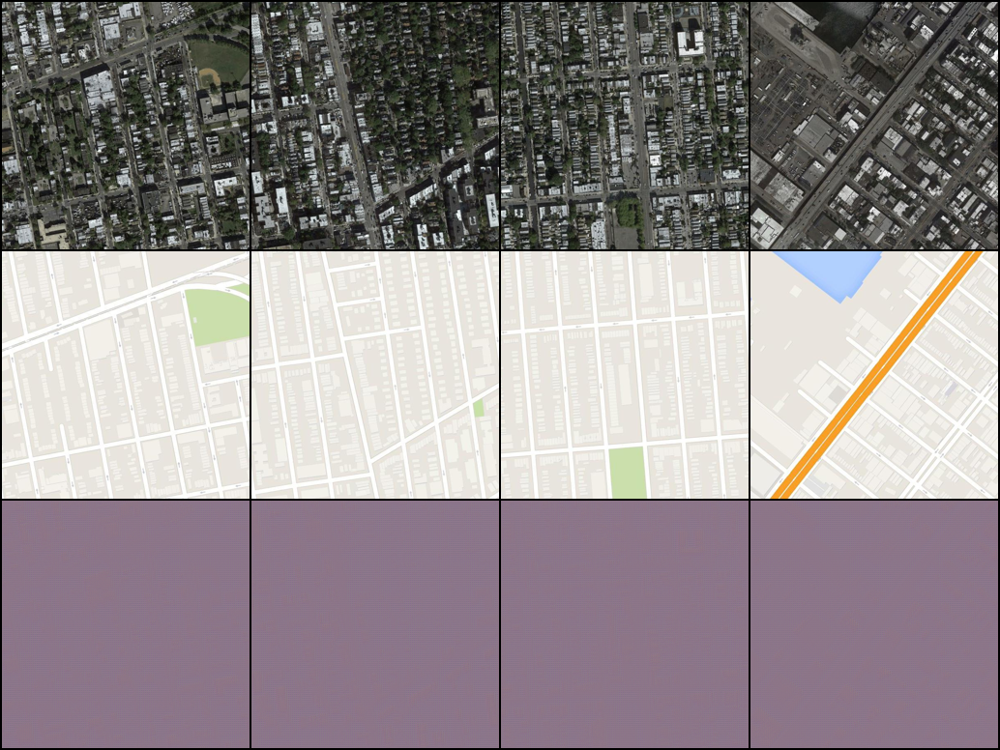


Epoch 10:
   (Final - fully trained)


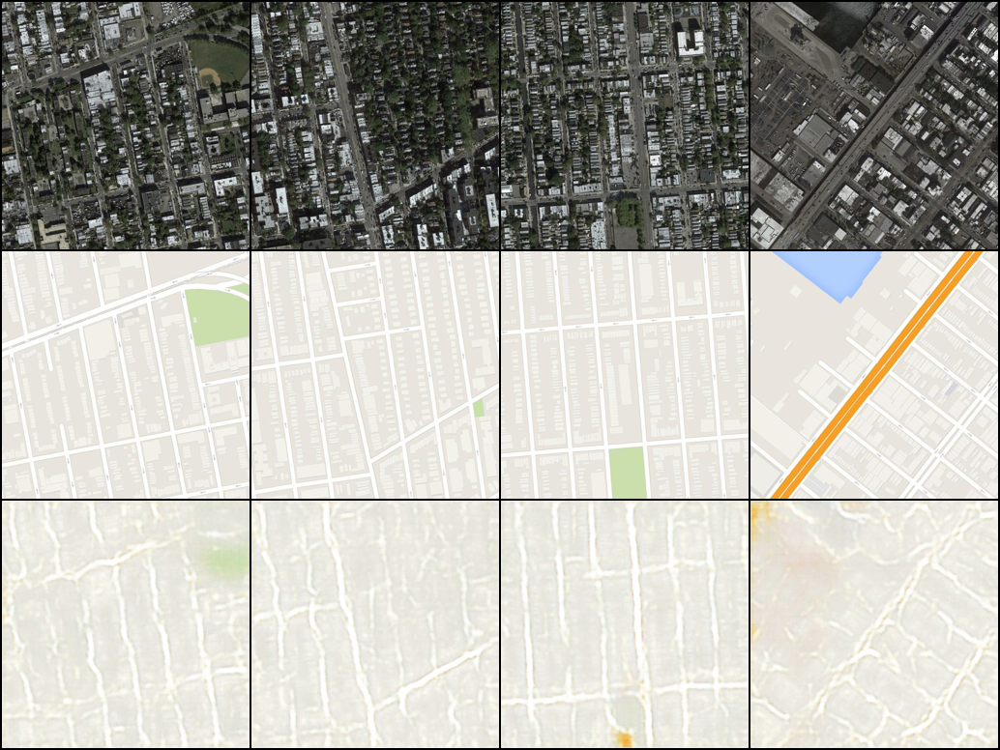


Epoch 20:
   (Final - fully trained)


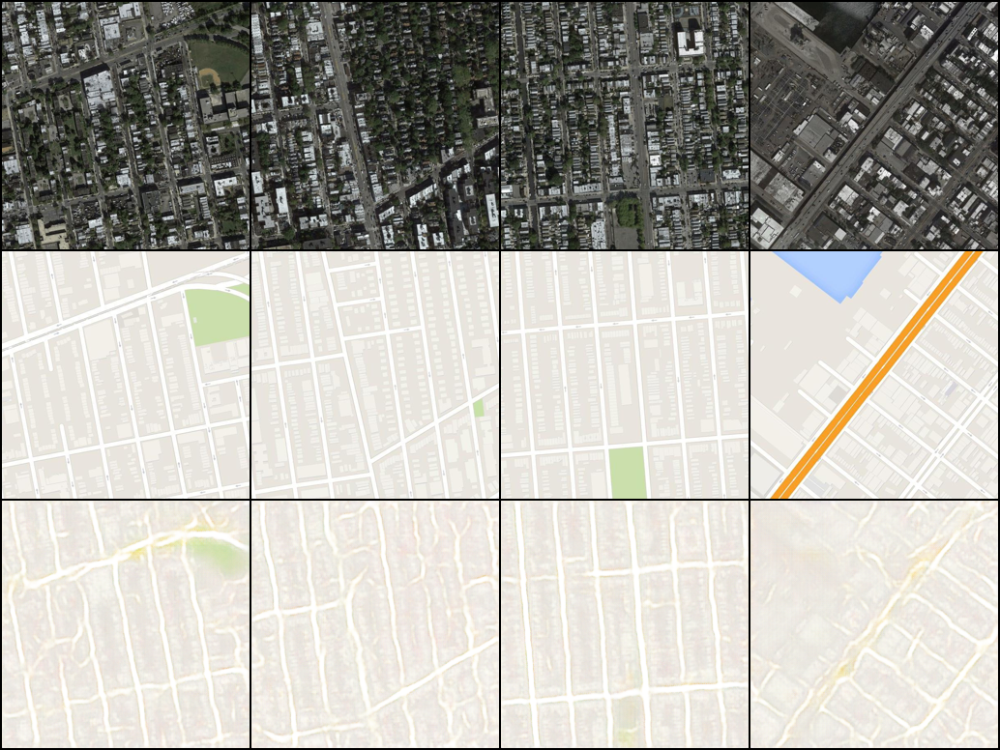


Epoch 30:
   (Final - fully trained)


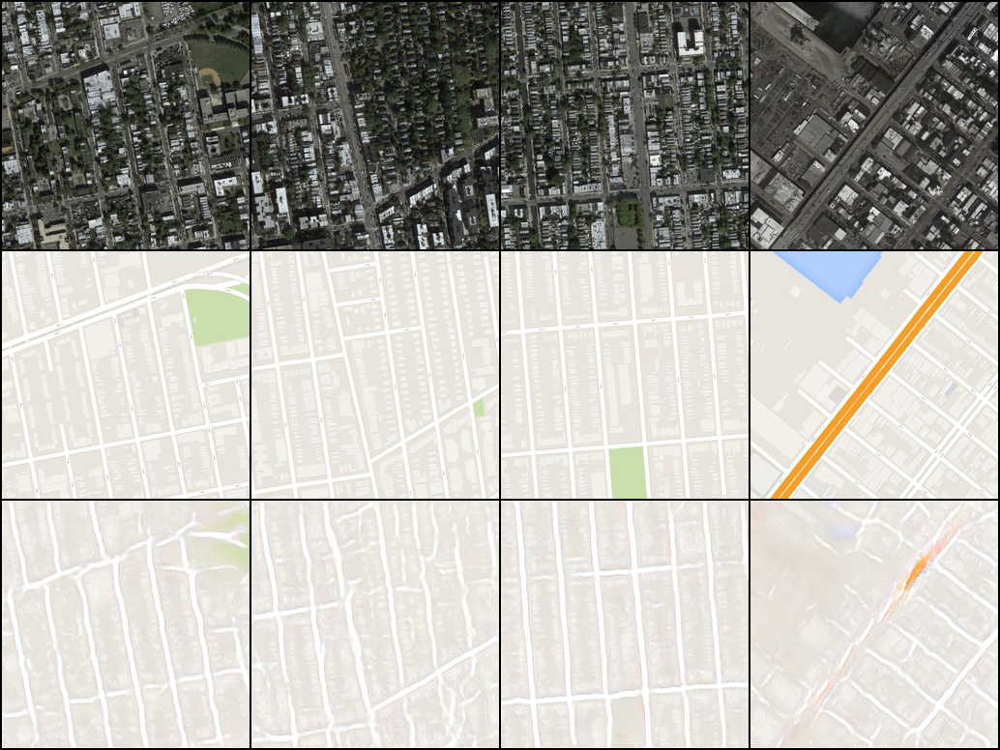


Epoch 40:
   (Final - fully trained)


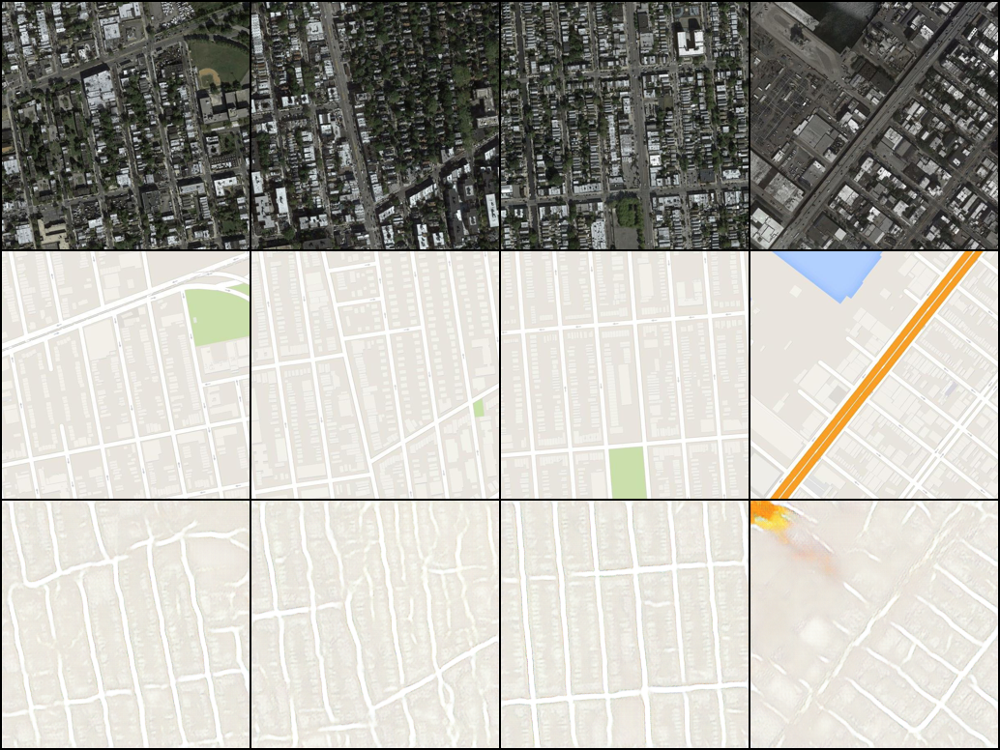


Epoch 50:
   (Midpoint - learning in progress)


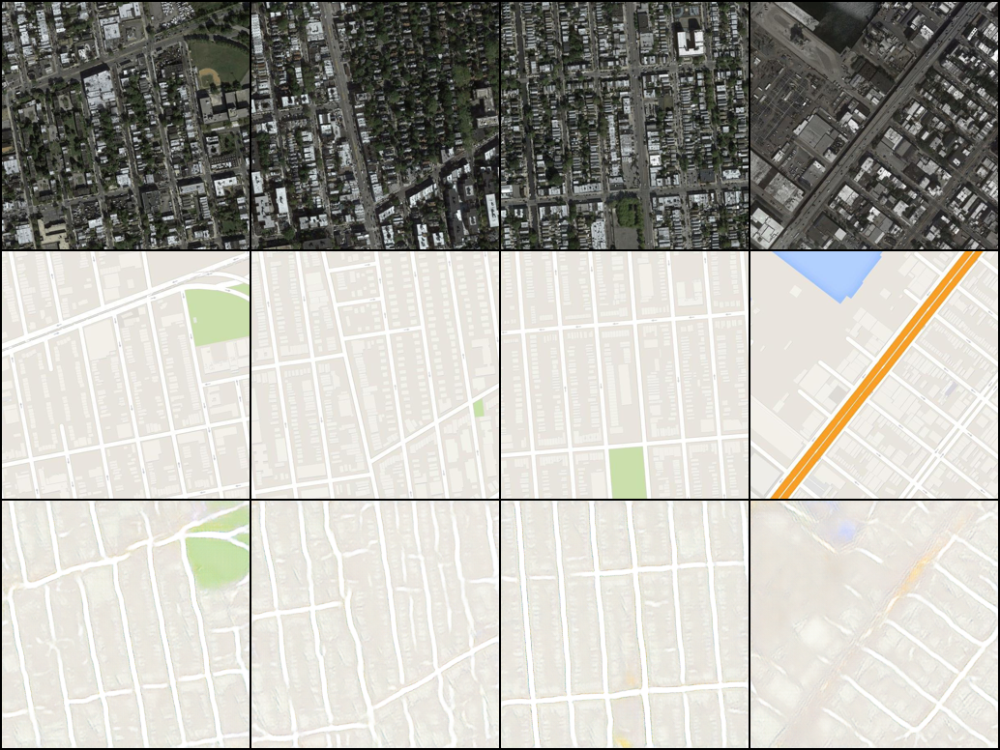


Epoch 60:
   (Final - fully trained)


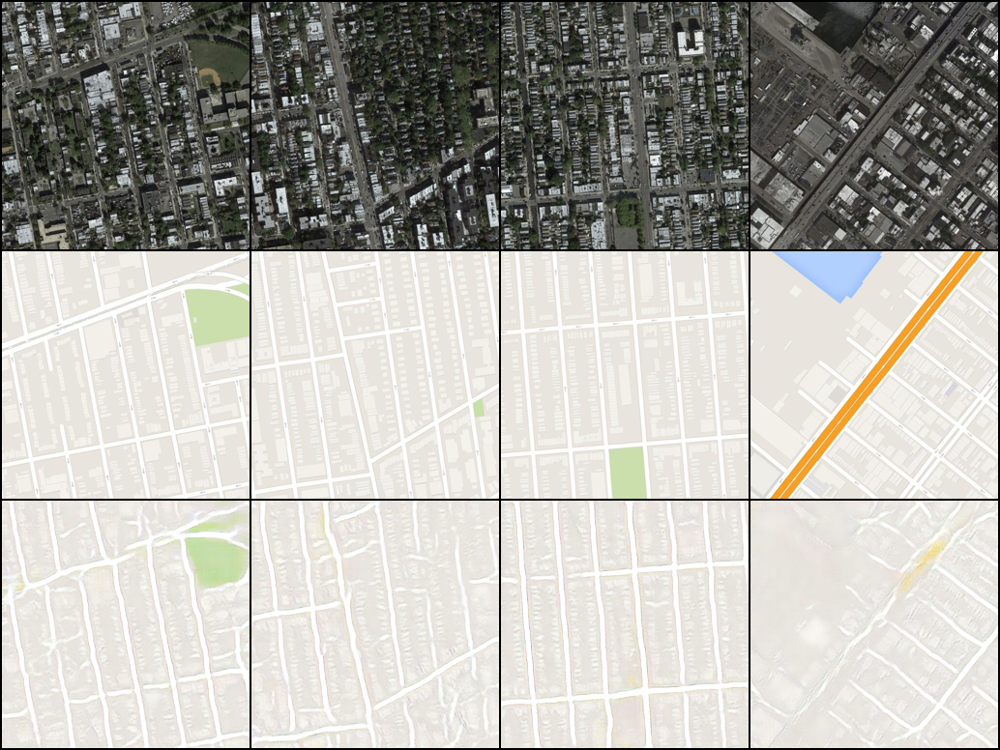


Epoch 70:
   (Final - fully trained)


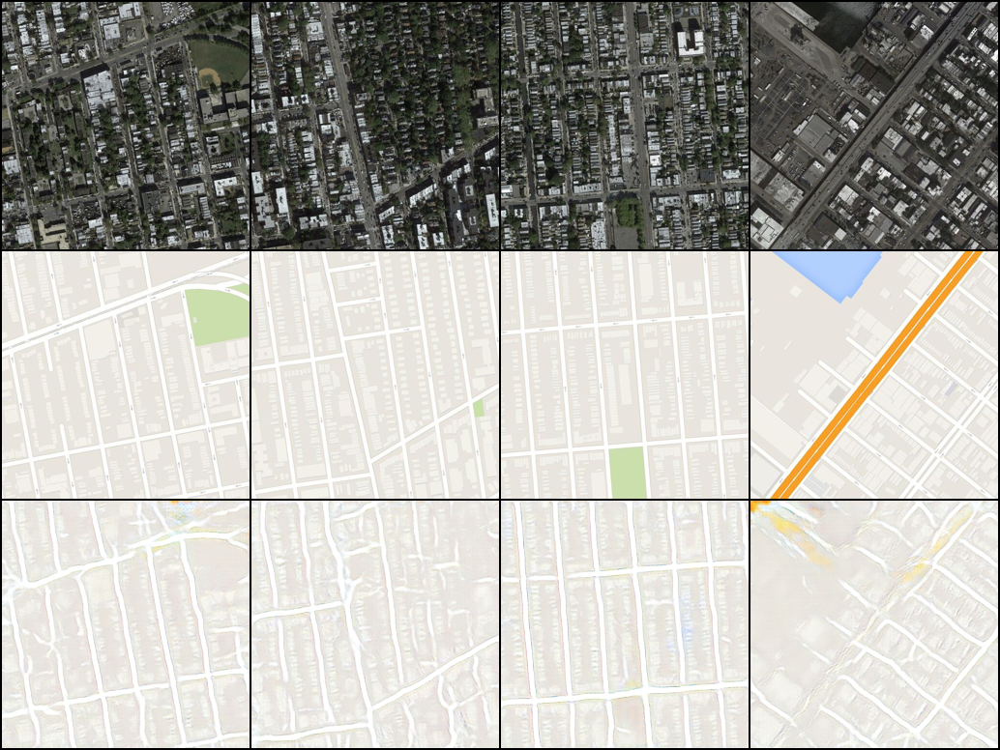


Epoch 80:
   (Final - fully trained)


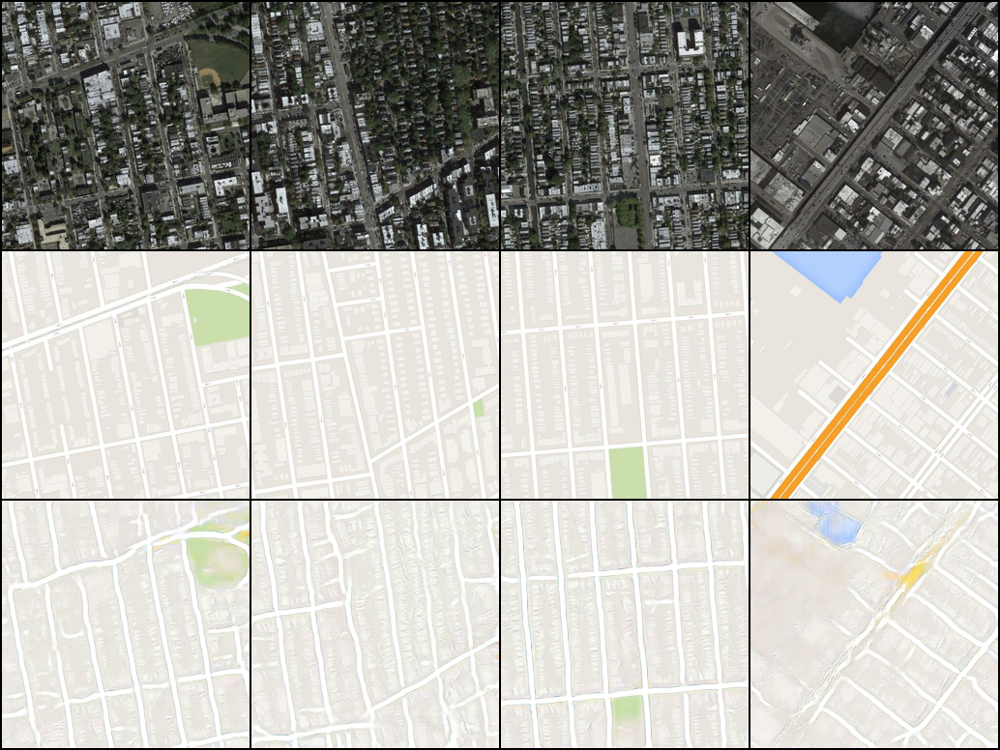


Epoch 90:
   (Final - fully trained)


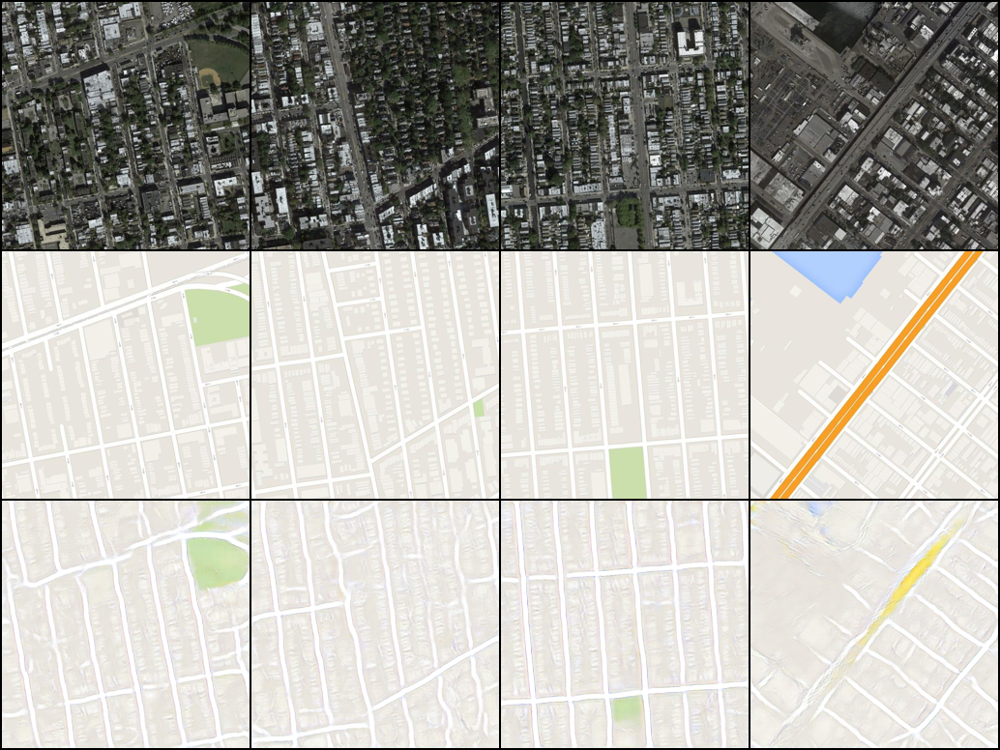

In [28]:
from IPython.display import display, Image as IPImage
from pathlib import Path

# Display progression across epochs
samples_dir = Path('pix2pix_results/samples')
epochs_to_show = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90]

print("="*70)
print("TRAINING PROGRESSION")
print("="*70)

for epoch in epochs_to_show:
    img_path = samples_dir / f'epoch_{epoch:04d}.png'
    if img_path.exists():
        print(f"\nEpoch {epoch}:")
        if epoch == 0:
            print("   (Untrained - random initialization)")
        elif epoch == 50:
            print("   (Midpoint - learning in progress)")
        else:
            print("   (Final - fully trained)")
        display(IPImage(filename=str(img_path)))
    else:
        print(f"\nEpoch {epoch}: Image not found at {img_path}")


In [26]:
# Create zip file
!zip -r -q pix2pix_results.zip pix2pix_results/

# Download
from google.colab import files
files.download('pix2pix_results.zip')

print("\nResults downloaded!")
print("\nContains:")
print("   • 11 sample images (epochs 0, 10, 20...90)")
print("   • 6 checkpoints (epochs 15, 30, 45...90)")
print("   • 10 final validation samples")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


Results downloaded!

Contains:
   • 11 sample images (epochs 0, 10, 20...90)
   • 6 checkpoints (epochs 15, 30, 45...90)
   • 10 final validation samples


In [ ]:
# Create zip file
!zip -r -q pix2pix_results.zip pix2pix_results/

# Download
from google.colab import files
files.download('pix2pix_results.zip')

print("\nResults downloaded!")
print("\nContains:")
print("   • 11 sample images (epochs 0, 10, 20...90)")
print("   • 6 checkpoints (epochs 15, 30, 45...90)")
print("   • 10 final validation samples")